In [1]:
# First-party imports
import sys, os
import warnings
sys.path.append(os.path.expanduser('~/Seacast'))
from src.seacast_tools.scoring_analysis import *
# Set up session settings
warnings.filterwarnings('ignore', category=FutureWarning)

# Experiments comparison
---

In [2]:
experiments_names = [
    'bathymetry_m_14_6_g2mm2g_1',
    'bathymetry_m_14_6_g2mm2g_2',
    'bathymetry_m_14_6_g2mm2g_3',
    'bathymetry_m_14_6_g2mm2g_4',
    'bathymetry_m_14_6_g2mm2g_5',
    'bathymetry_m_14_6_g2mm2g_6',
    ]

experiments = [StatsLoader(os.path.join("~/Seacast/output/exps_g2m", exp_name)) for exp_name in experiments_names]
experiments

[ExpStats(name=bathymetry_m_14_6_g2mm2g_1, stats_dir=/home/giovanny/Seacast/output/exps_g2m/bathymetry_m_14_6_g2mm2g_1/statistics),
 ExpStats(name=bathymetry_m_14_6_g2mm2g_2, stats_dir=/home/giovanny/Seacast/output/exps_g2m/bathymetry_m_14_6_g2mm2g_2/statistics),
 ExpStats(name=bathymetry_m_14_6_g2mm2g_3, stats_dir=/home/giovanny/Seacast/output/exps_g2m/bathymetry_m_14_6_g2mm2g_3/statistics),
 ExpStats(name=bathymetry_m_14_6_g2mm2g_4, stats_dir=/home/giovanny/Seacast/output/exps_g2m/bathymetry_m_14_6_g2mm2g_4/statistics),
 ExpStats(name=bathymetry_m_14_6_g2mm2g_5, stats_dir=/home/giovanny/Seacast/output/exps_g2m/bathymetry_m_14_6_g2mm2g_5/statistics),
 ExpStats(name=bathymetry_m_14_6_g2mm2g_6, stats_dir=/home/giovanny/Seacast/output/exps_g2m/bathymetry_m_14_6_g2mm2g_6/statistics)]

/home/giovanny/Seacast/src/seacast_tools/scoring_analysis.py:108: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  statistics[score_name][variable_name] = xr.load_dataarray(filepath)
/home/giovanny/Seacast/src/seacast_tools/scoring_analysis.py:108: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  statistics[score_name][variable_name] = xr.load_dataarray(filepath)
/home/giovanny/Seacast/src/seacast_tools/scoring_analysis.py:108: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  statistics[score_name][variable_name] = xr.load_dataarray(filepath

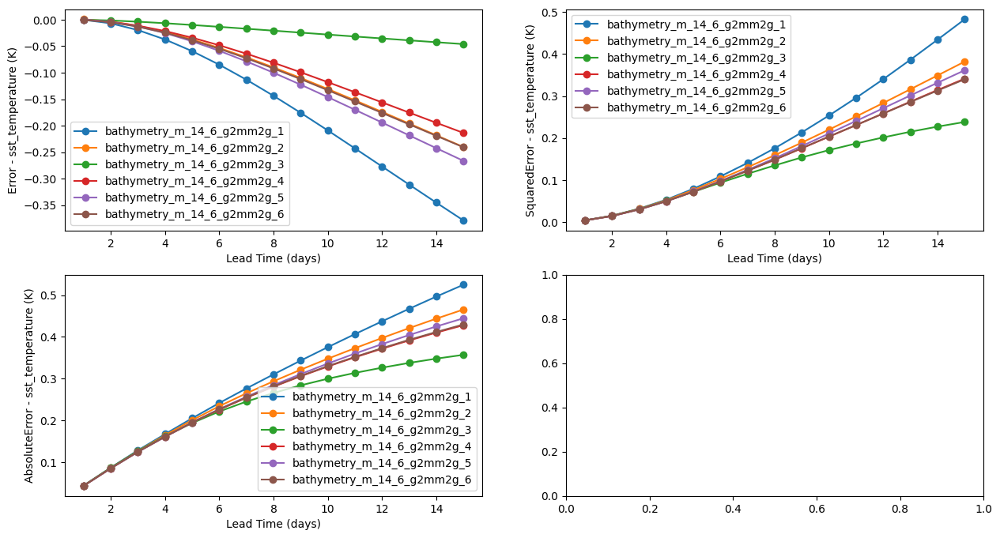

In [3]:
# Number of rows for the plot grid depending on the number of scores
fig, axs = plt.subplots(2, 2, figsize=(15, 8))
axs = axs.flatten()
# Plot each score and variable in the grid
for exp in experiments:
    with StatsAggSession(exp) as stats:
        lead_time_scores = stats.agg_scores(
            ['init_time', 'latitude', 'longitude']
            )
        axs = plot_lead_time_scores(
            stats.exp_name, 
            stats.score_names, 
            stats.variable_names, 
            lead_time_scores, 
            axs
            )

/home/giovanny/Seacast/src/seacast_tools/scoring_analysis.py:108: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  statistics[score_name][variable_name] = xr.load_dataarray(filepath)
/home/giovanny/Seacast/src/seacast_tools/scoring_analysis.py:108: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  statistics[score_name][variable_name] = xr.load_dataarray(filepath)
/home/giovanny/Seacast/src/seacast_tools/scoring_analysis.py:108: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  statistics[score_name][variable_name] = xr.load_dataarray(filepath

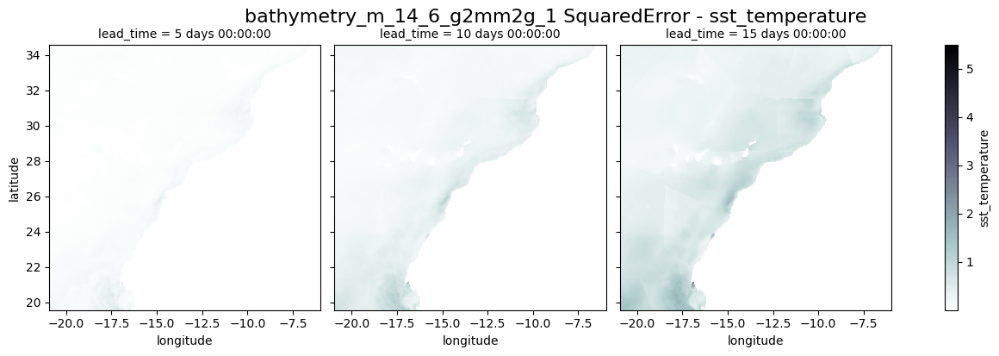

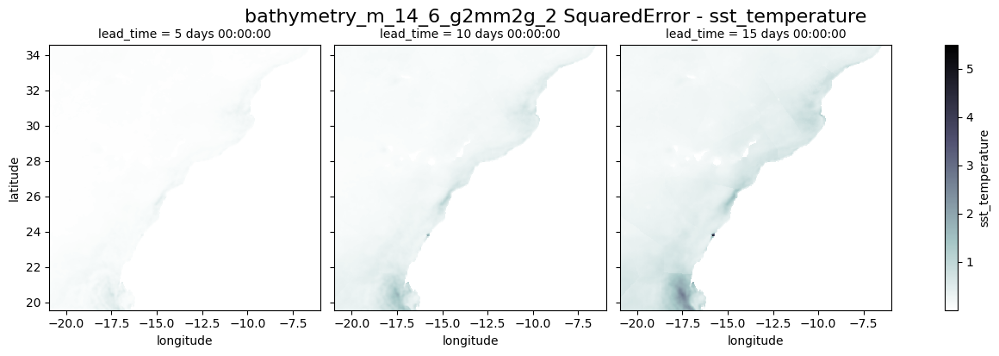

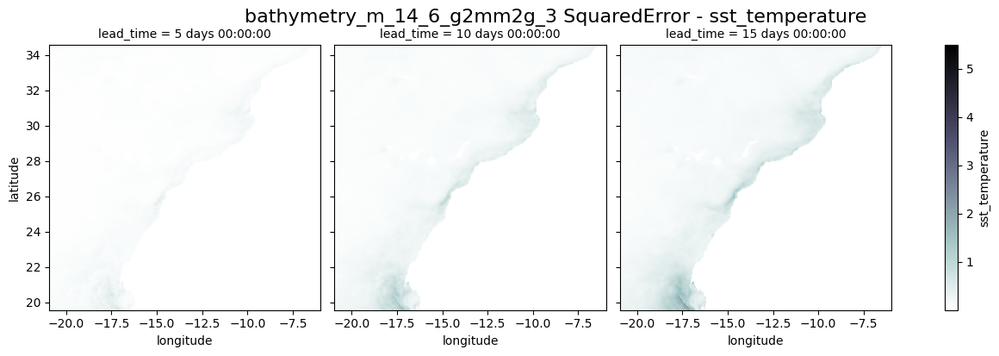

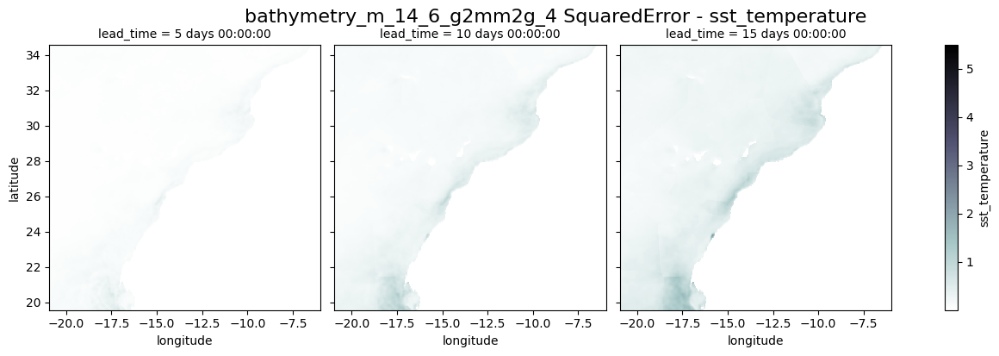

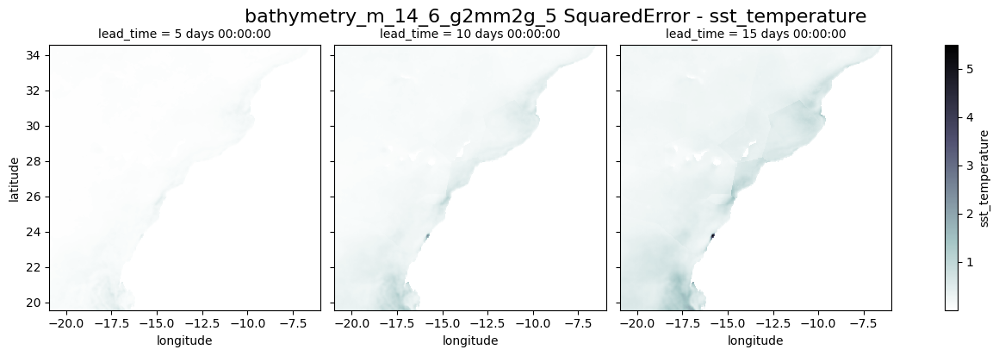

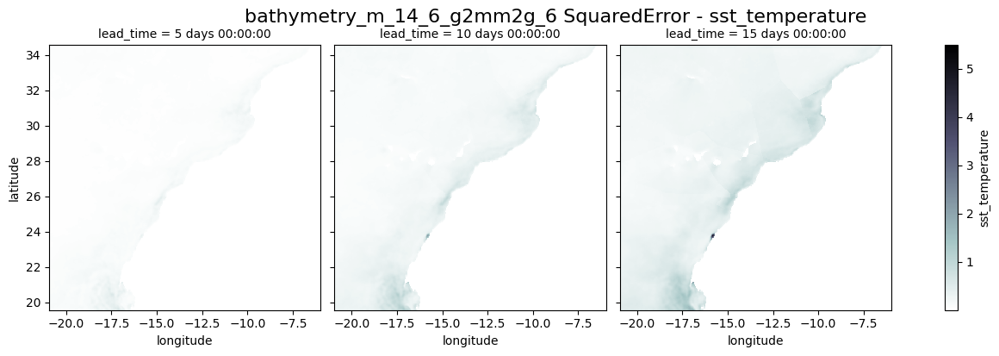

In [4]:
# Parameters for the map scores
score = 'SquaredError'
var_name = 'sst_temperature'
lead_days = [4, 9, 14]  # Example lead times to filter

# Compute the minimum and maximum values for the map scores
vmin_exp = []
vmax_exp = [] 
for exp in experiments: 
    with StatsAggSession(exp) as stats:
        vmin_data, vmax_data = get_min_max(stats.agg_scores(['init_time']))
        vmin_exp.append(vmin_data[score][var_name])
        vmax_exp.append(vmax_data[score][var_name])

vmin = min(vmin_exp)
vmax = max(vmax_exp)

# Plot the map scores
for exp in experiments: 
    with StatsAggSession(exp) as stats:
        plot_map_scores(
            exp_name=stats.exp_name,
            score_name=score,
            variable_names=stats.variable_names,
            map_scores=filter_statistics(
                stats.agg_scores(['init_time']),
                dim_name='lead_time',
                filter_idx=lead_days,
                ),
            vmin=vmin,
            vmax=vmax,
            n_cols=3,
            cmap='coolwarm' if score == 'Error' else 'bone_r'
            )

:: exp: bathymetry_m_14_6_g2mm2g_1


:: exp: bathymetry_m_14_6_g2mm2g_2
:: exp: bathymetry_m_14_6_g2mm2g_3
:: exp: bathymetry_m_14_6_g2mm2g_4
:: exp: bathymetry_m_14_6_g2mm2g_5
:: exp: bathymetry_m_14_6_g2mm2g_6
CPU times: user 1min 4s, sys: 56.2 s, total: 2min 1s
Wall time: 2min 1s


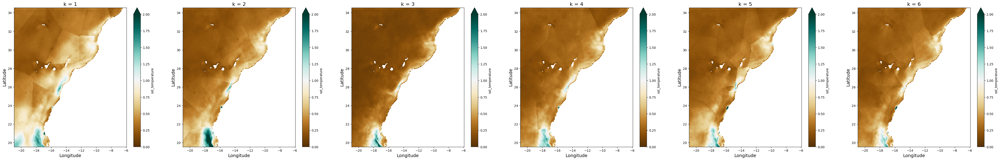

In [5]:
%%time
# Parameters for the map scores
score = 'SquaredError'
var_name = 'sst_temperature'
lead_days = [14]  # Example lead times to filter

size = 8
n_exp = len(experiments)
fig, axs = plt.subplots(1, n_exp, figsize=(n_exp*size + size, size))
axs_f = axs.flatten() if hasattr(axs, 'flatten') else axs
vmin, vmax = 0.0, 2.0  # Ajusta según tu rango esperado de error
for ax, exp in zip(axs_f, experiments): 
    print(f":: exp: {exp.name}")
    with StatsAggSession(exp) as stats:
        data = filter_statistics(
            stats.agg_scores(['init_time']),
            dim_name='lead_time',
            filter_idx=lead_days,
            )[score][var_name].squeeze()
            
        data.plot(
            x="longitude",
            y="latitude",
            cmap='BrBG',
            rasterized=True,
            ax=ax,
            vmin=vmin,
            vmax=vmax,
            )
        ax.set_title(f"k = {stats.exp_name[-1]}", fontsize=16)
        ax.set_xlabel("Longitude", fontsize=14)
        ax.set_ylabel("Latitude", fontsize=14)
plt.savefig("/home/giovanny/Seacast/reports/figures/b_mesh_rmse_map_by_k.pdf", bbox_inches='tight')

/home/giovanny/Seacast/src/seacast_tools/scoring_analysis.py:108: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  statistics[score_name][variable_name] = xr.load_dataarray(filepath)
/home/giovanny/Seacast/src/seacast_tools/scoring_analysis.py:108: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  statistics[score_name][variable_name] = xr.load_dataarray(filepath)
/home/giovanny/Seacast/src/seacast_tools/scoring_analysis.py:108: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  statistics[score_name][variable_name] = xr.load_dataarray(filepath

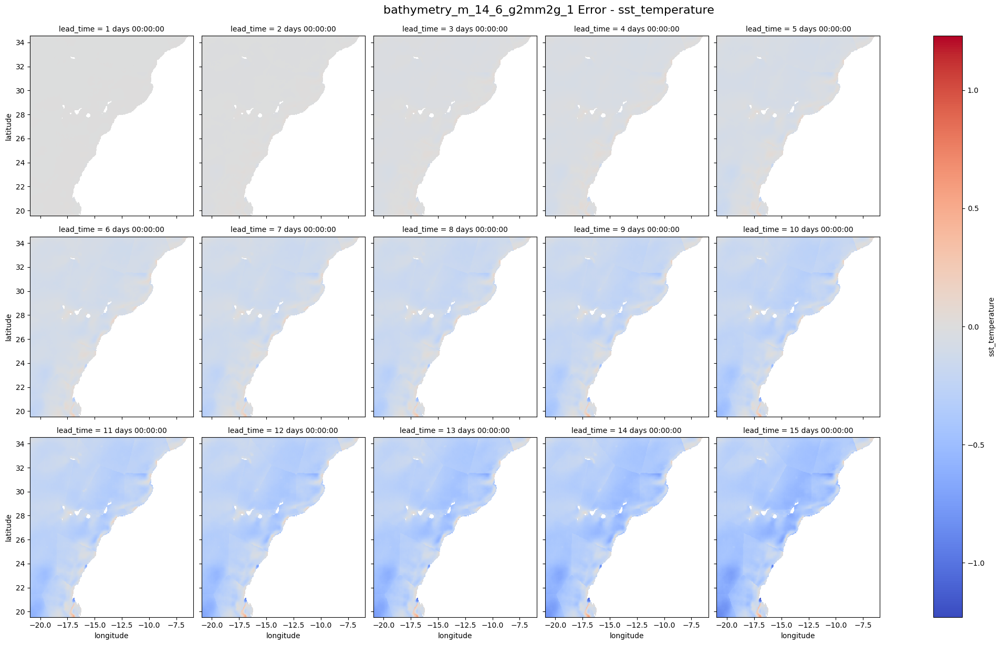

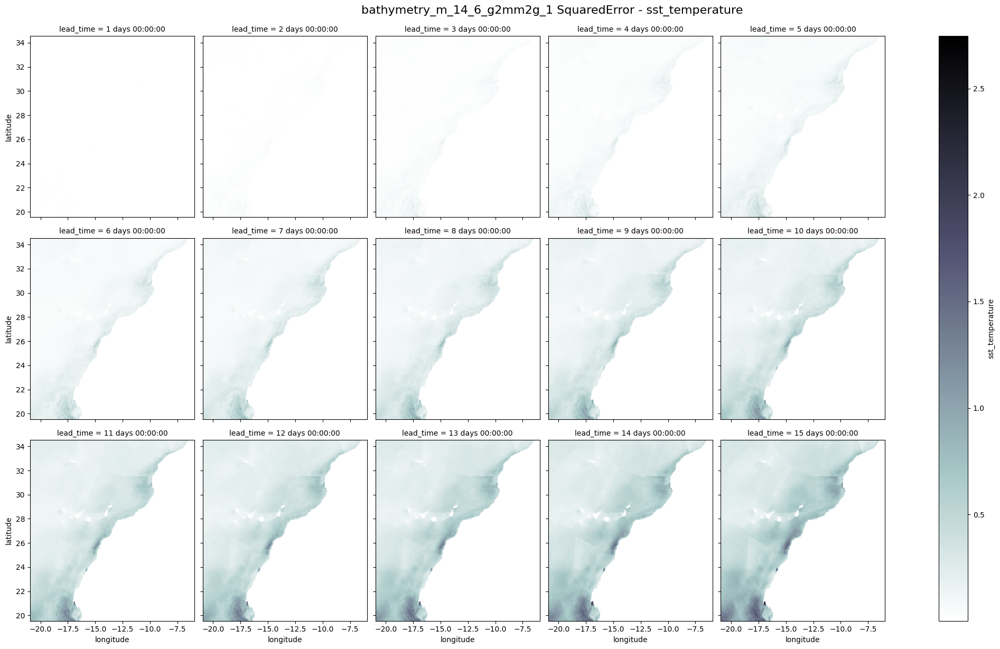

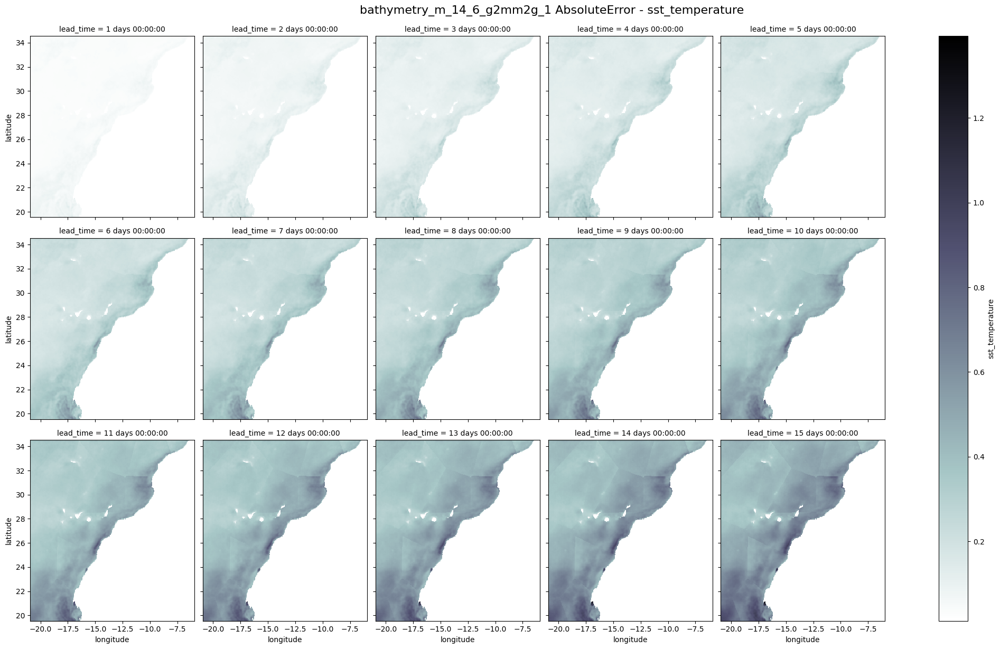

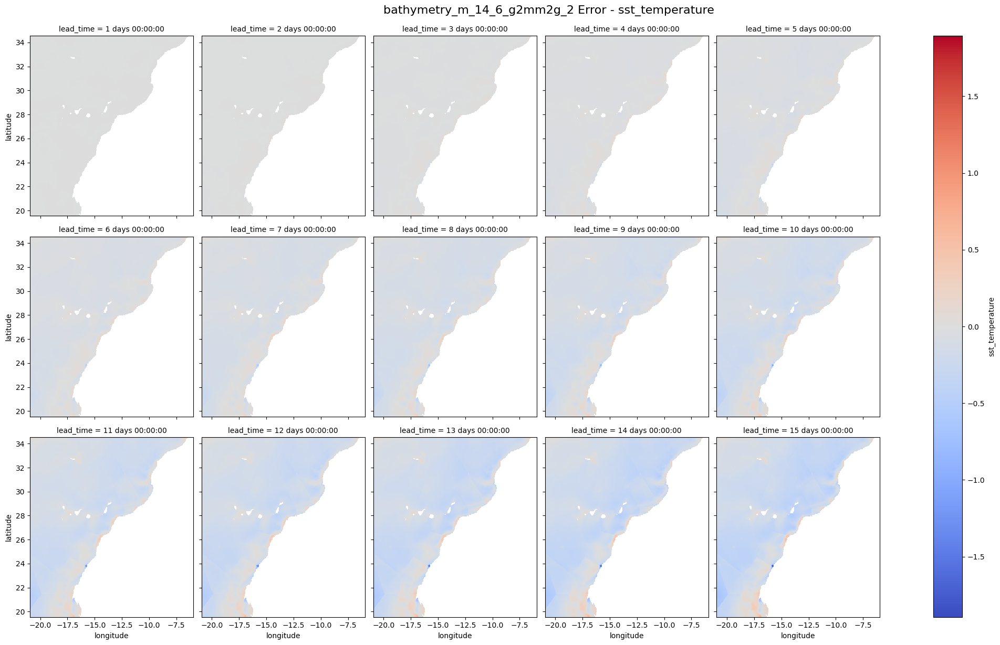

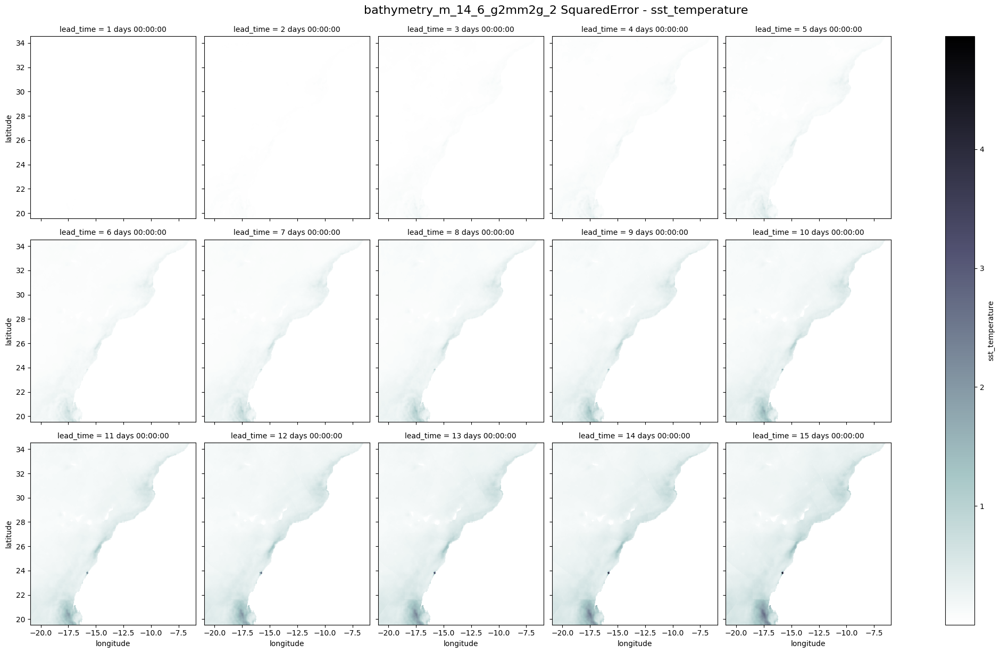

...

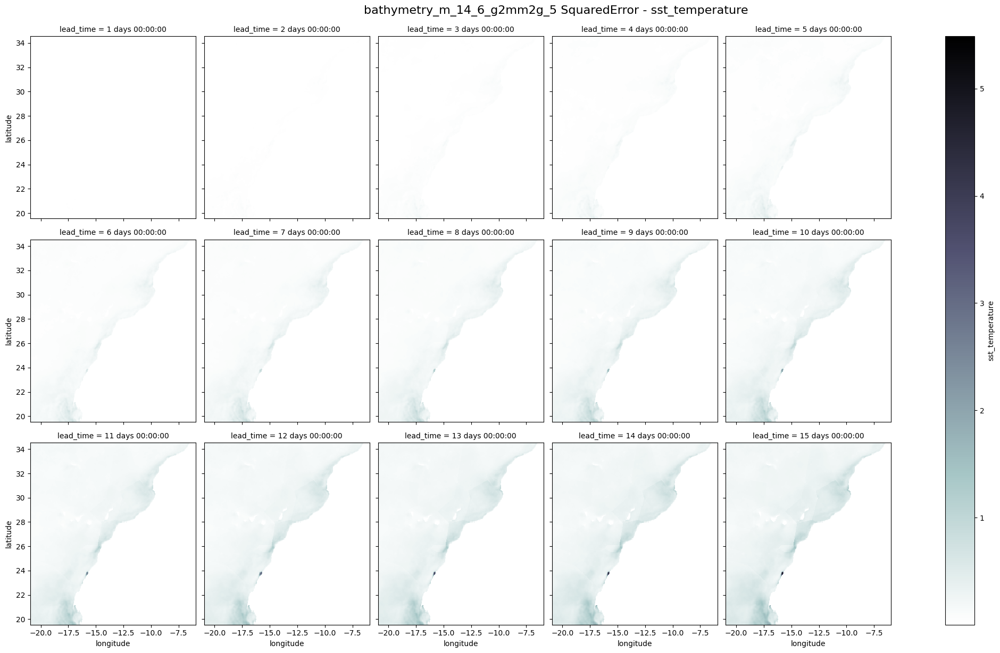

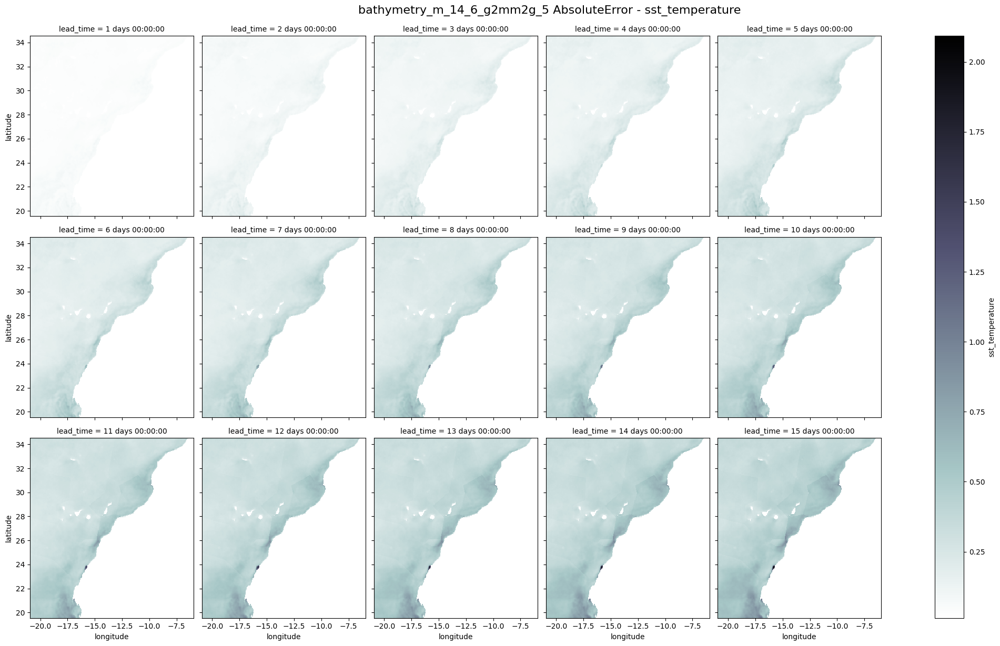

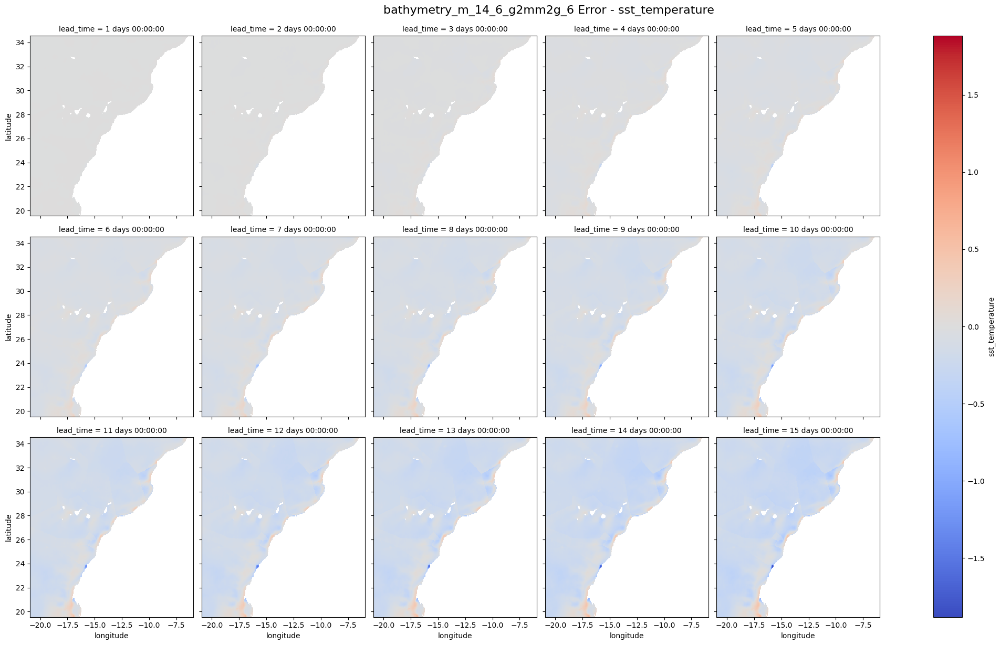

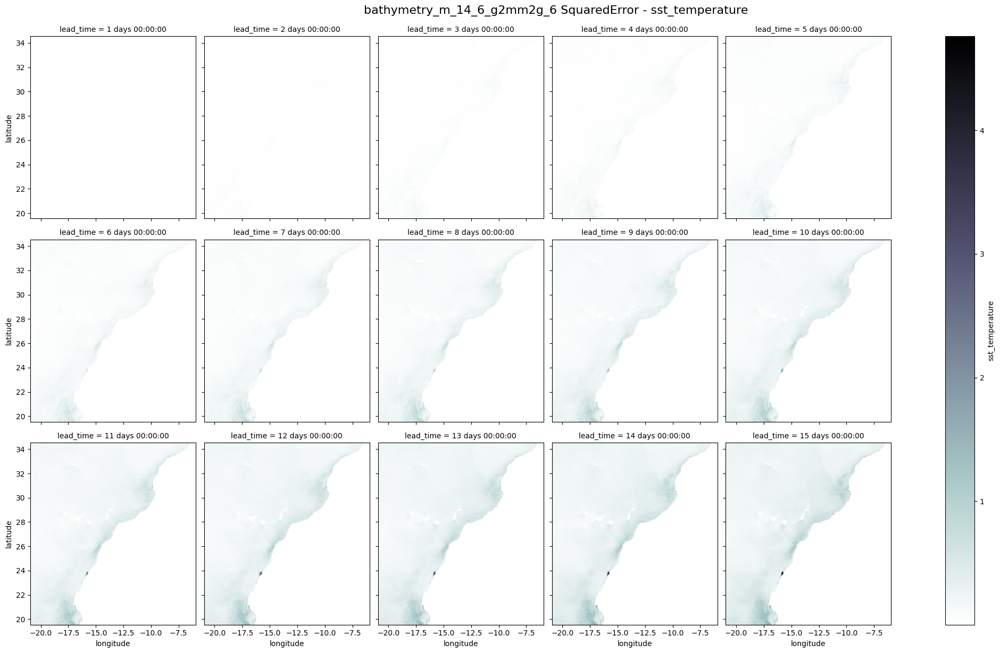

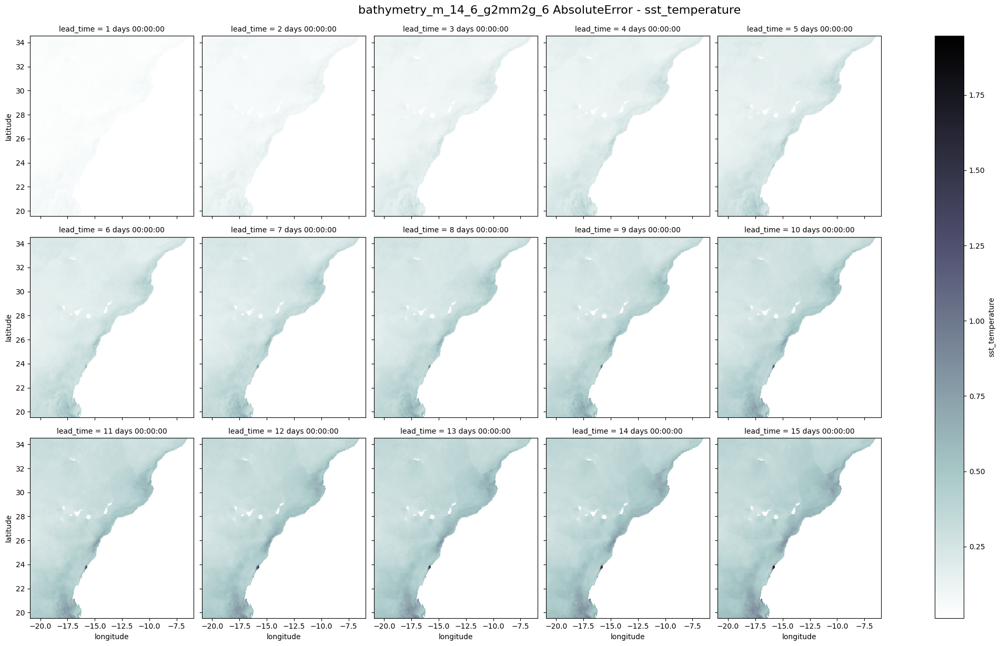

In [6]:
for exp in experiments: 
    with StatsAggSession(exp) as stats:
        for score in stats.score_names:
            plot_map_scores(
                exp_name=stats.exp_name,
                score_name=score,
                variable_names=stats.variable_names,
                map_scores=stats.agg_scores(['init_time']),
                cmap='coolwarm' if score == 'Error' else 'bone_r'
                )